<a href="https://colab.research.google.com/github/146790g/VGG19-BreakHis-Non-Transfer-Learning-with-Augmentation/blob/master/BreakHis_VGG19_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 深層学習 VGG19モデルを用いた乳がん染色画像（BreakHis）の解析
#（その2 : Visual Predictive Check ）
##  Deep Learning for Magnification Independent Breast Cancer Histopathology
## Image Classification using VGG19 Model - Visual Predictive Check



<h2>対象データは、こちらをクリック</>
<a href='https://www.kaggle.com/ambarish/breakhis'>Kaggle BreakHis Data</a>

４つのMagnification levelのデータをすべて合算して、解析する

<br>

## 4 Magnification Levels: ×40, ×100, ×200, ×400


During analysis and annotation, pathologists starts by identifying ROIs in
the lowest magnification level slide (×40), then dives deeper in the latter using higher magnification levels (×100, ×200) until having a profound insight
(×400). 

<br>

## データ数 の概要

・Training Data: 5026 images <br>
  -- Benign Data: 1472 images <br>
  -- Mallignant Data: 3554 images 

・Validation Data: 2904 images <br>
  -- Benign Data: 1008 images <br>
  -- Mallignant Data:1896 images <br>

## Data Set Details by Magnification levels.

 ×40 : <br>
×100 : <br>
×200 : <br>
×400 : <br>

In [1]:
%tensorflow_version 2.x

In [2]:
%pwd
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [3]:
!ls -lh '/content/gdrive/My Drive/Colab Notebooks/BreakHis/data'

total 8.0K
drwx------ 2 root root 4.0K Jul 21 03:42 train
drwx------ 2 root root 4.0K Jul 27 01:49 validation


In [4]:
from keras.applications.vgg19 import VGG19
from keras.preprocessing.image import ImageDataGenerator,load_img
import numpy as np
import os
#import Pillow
#from PIL import Image
#import opencv
from PIL import Image
from keras.preprocessing.image import load_img, save_img, img_to_array, array_to_img
import numpy as np
from pandas import DataFrame
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import layers, models, initializers

from keras.models import Sequential, Model
from keras.layers import Input, Activation, Dropout, Flatten, Dense
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers
import numpy as np


train_data_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/data/train' # Training Data のフォルダー
validation_data_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/data/validation' # Validation Data のフォルダー
result_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/results'        # VGG19の出力結果を保存するフォルダー
test_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/test'
    


##第１章　Visual Predictive Check


In [5]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras.applications.vgg16 import VGG16
from keras.models import Sequential, Model
from keras.layers import Input, Activation, Dropout, Flatten, Dense
from keras.preprocessing import image
import numpy as np
from keras.models import load_model

model=load_model(os.path.join(result_dir,'breakhis_vgg19model_parameter.h5'))



model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Functional)           (None, 12, 12, 512)       20024384  
_________________________________________________________________
flatten (Flatten)            (None, 73728)             0         
_________________________________________________________________
dense (Dense)                (None, 256)               18874624  
_________________________________________________________________
sigmoid (Dense)              (None, 1)                 257       
Total params: 38,899,265
Trainable params: 28,314,113
Non-trainable params: 10,585,152
_________________________________________________________________


## モデルの読み込み 

In [6]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras.applications.vgg19 import VGG19
from keras.models import Sequential, Model
from keras.layers import Input, Activation, Dropout, Flatten, Dense
from keras.preprocessing import image
import numpy as np
from keras.models import load_model


def predictBreakHisVGG19(file):
    '''
    画像を読み込んでVGG19とFC層で予測する
    file：対象の画像のディレクトリ
    '''
    img_h, img_w =400, 400
    channels = 3
    
    model=load_model(os.path.join(result_dir,'breakhis_vgg19model_parameter.h5'))
    

    model.compile(loss='binary_crossentropy',
                  optimizer = 'adam',
                  metrics=['accuracy'])
    


    filename=file
    
    img = image.load_img(
        filename,
        target_size=(img_h, img_w))
    
    # (height, width, channel)の3階テンソルに変換
    x = image.img_to_array(img)
    # 4階テンソルに変換
    x = np.expand_dims(x, axis=0)
    # RGB値を0.0～1.0の範囲に変換
    x = x / 255.0
    
    # モデルに入力して予測する
    # 入力は1枚の画像なのでx[0]のみ
    pred = model.predict(x[0:])
    # 0.5以上はmalignant、0.5より小さければbenign
    if pred >= 0.5:
        print(pred, '-> Malignantです。')
    else:
        print(pred, '-> Benignです。')

    # 画像を描画
    img = mpimg.imread(file)
    plt.axis('off')
    imgplot = plt.imshow(img)
    plt.show()

## 予測結果

### 健康成人由来のX線画像に対して、先ほど構築したモデルで予測する。
『benignです。』と表示されていれば、正解。

60
['SOB_B_A-14-22549G-200-029.png', 'SOB_B_PT-14-21998AB-200-047.png', 'SOB_B_TA-14-15275-400-007.png', 'SOB_B_PT-14-21998AB-40-018.png', 'SOB_B_F-14-21998CD-400-020.png', 'SOB_B_A-14-29960CD-400-010.png', 'SOB_B_A-14-22549G-200-028.png', 'SOB_B_F-14-9133-200-003.png', 'SOB_B_F-14-9133-400-001.png', 'SOB_B_TA-14-3411F-100-002.png', 'SOB_B_A-14-29960CD-40-008.png', 'SOB_B_F-14-21998CD-100-018.png', 'SOB_B_PT-14-21998AB-400-015.png', 'SOB_B_TA-14-16184-40-013.png', 'SOB_B_PT-14-21998AB-400-021.png', 'SOB_B_F-14-21998CD-400-008.png', 'SOB_B_A-14-22549G-400-008.png', 'SOB_B_PT-14-21998AB-100-066.png', 'SOB_B_F-14-21998CD-40-011.png', 'SOB_B_A-14-29960CD-40-014.png', 'SOB_B_A-14-29960CD-400-003.png', 'SOB_B_TA-14-3411F-400-001.png', 'SOB_B_F-14-23222AB-100-003.png', 'SOB_B_PT-14-21998AB-100-018.png', 'SOB_B_PT-14-21998AB-200-019.png', 'SOB_B_PT-14-21998AB-40-010.png', 'SOB_B_TA-14-3411F-100-007.png', 'SOB_B_A-14-22549G-100-032.png', 'SOB_B_A-14-29960CD-40-015.png', 'SOB_B_F-14-23222AB-40-0

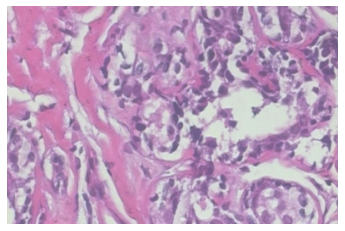

[[0.998923]] -> Malignantです。


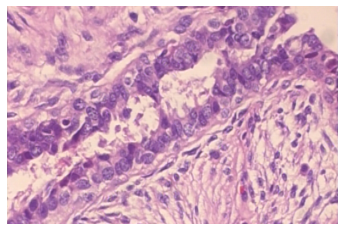

[[0.80073893]] -> Malignantです。


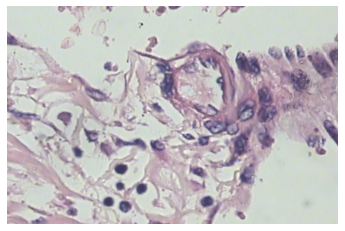

[[0.7943165]] -> Malignantです。


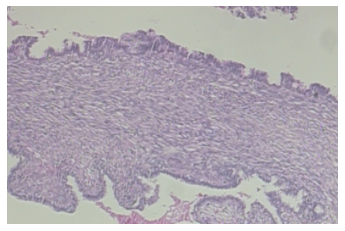

[[2.1295991e-05]] -> Benignです。


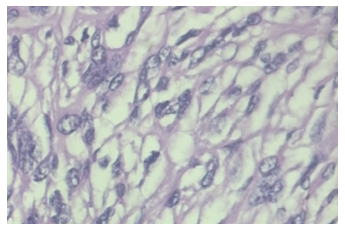

[[2.2669806e-08]] -> Benignです。


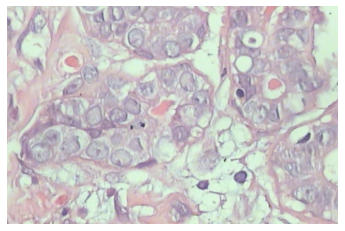

[[0.9887239]] -> Malignantです。


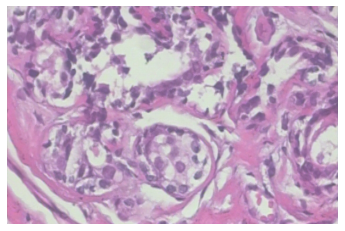

[[0.00510702]] -> Benignです。


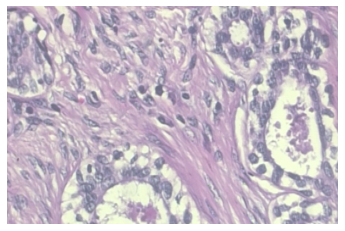

[[0.00738163]] -> Benignです。


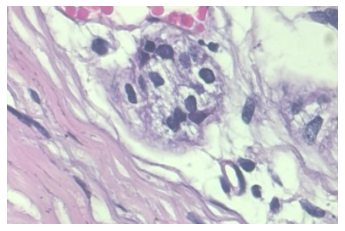

[[6.9908256e-06]] -> Benignです。


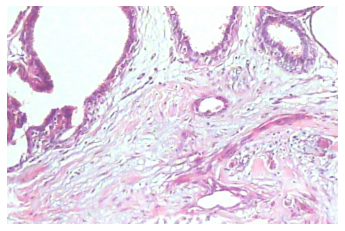

[[0.00111834]] -> Benignです。


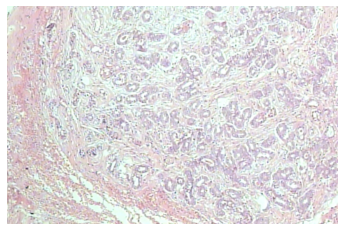

[[0.0850459]] -> Benignです。


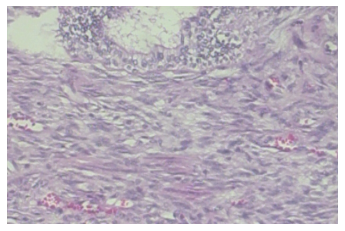

[[0.00086478]] -> Benignです。


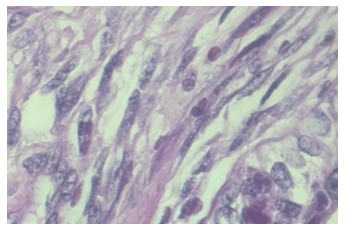

[[0.00080863]] -> Benignです。


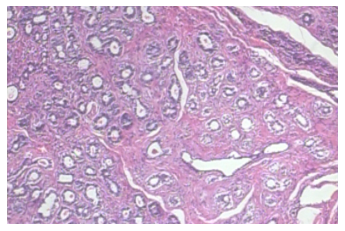

[[0.00025652]] -> Benignです。


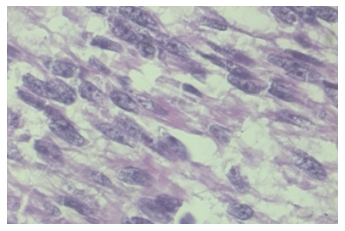

[[0.99485034]] -> Malignantです。


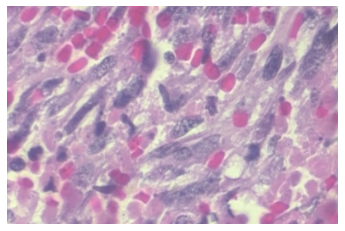

[[0.03091441]] -> Benignです。


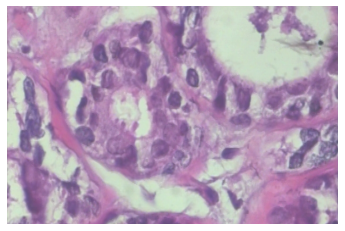

[[0.94811857]] -> Malignantです。


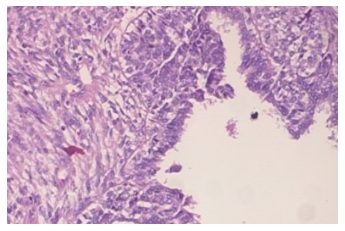

[[0.75697356]] -> Malignantです。


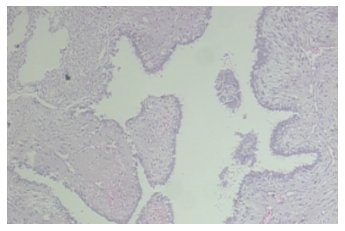

[[2.24087e-06]] -> Benignです。


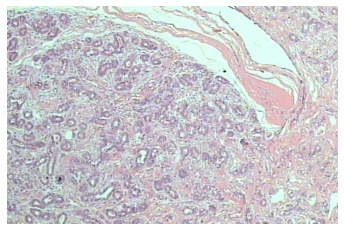

[[0.1764082]] -> Benignです。


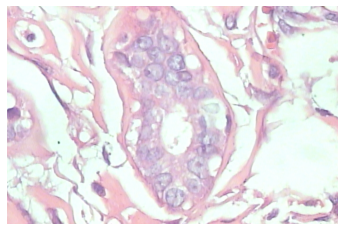

[[0.00019113]] -> Benignです。


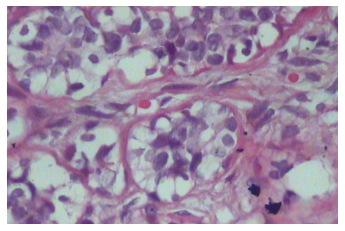

[[5.3627215e-08]] -> Benignです。


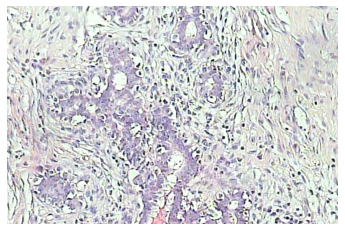

[[0.19620806]] -> Benignです。


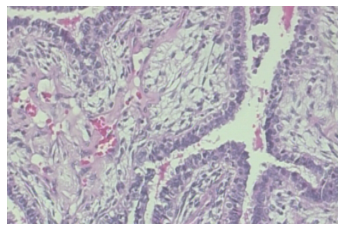

[[0.0006963]] -> Benignです。


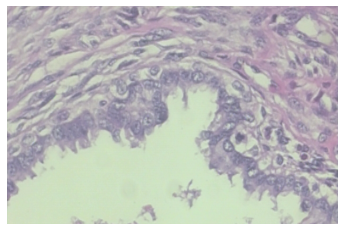

[[0.22903924]] -> Benignです。


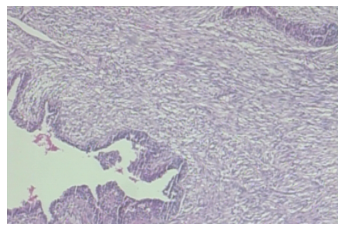

[[0.0183332]] -> Benignです。


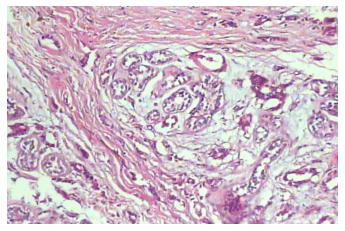

[[0.99886346]] -> Malignantです。


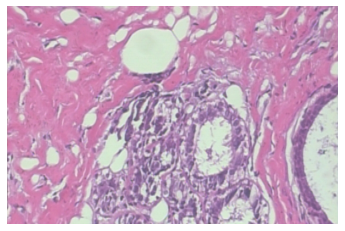

[[8.355059e-08]] -> Benignです。


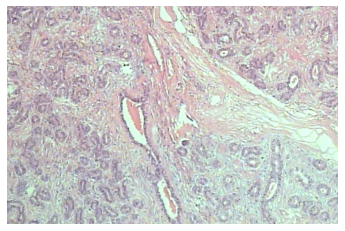

[[2.4760613e-16]] -> Benignです。


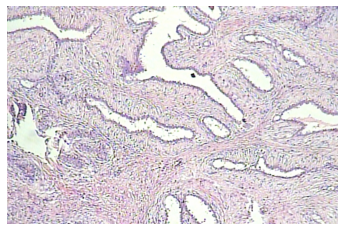

[[1.5446832e-14]] -> Benignです。


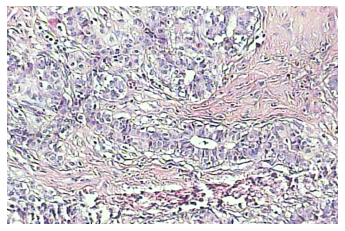

[[0.9898599]] -> Malignantです。


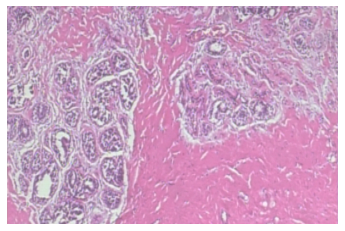

[[0.0781114]] -> Benignです。


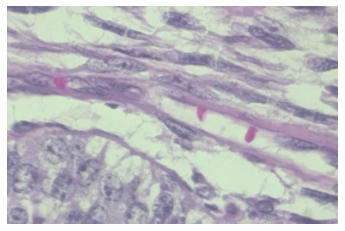

[[0.00881458]] -> Benignです。


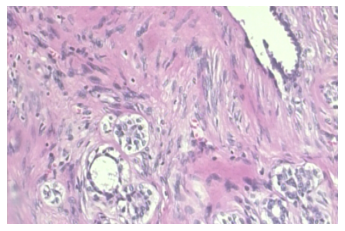

[[0.44763225]] -> Benignです。


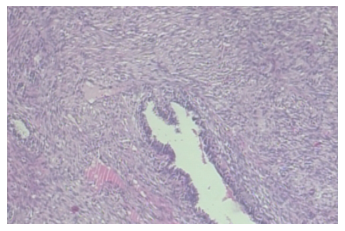

[[0.01153348]] -> Benignです。


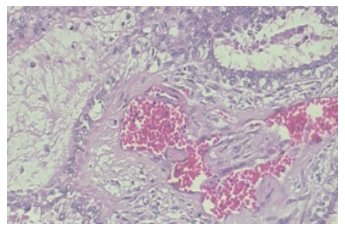

[[3.4062283e-05]] -> Benignです。


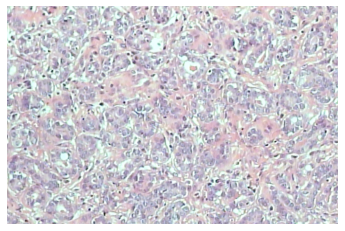

[[0.2704917]] -> Benignです。


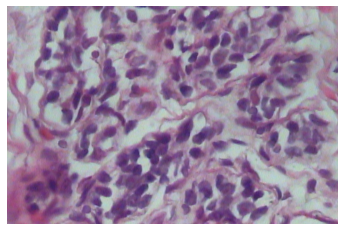

[[0.979592]] -> Malignantです。


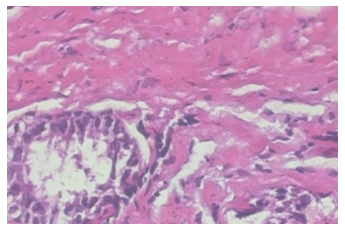

[[2.3588532e-06]] -> Benignです。


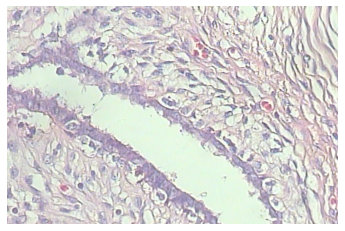

[[0.99969184]] -> Malignantです。


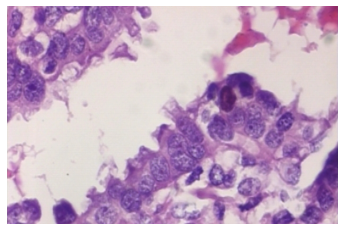

[[0.09874241]] -> Benignです。


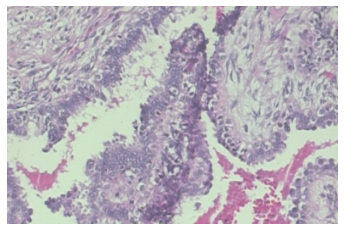

[[0.05892374]] -> Benignです。


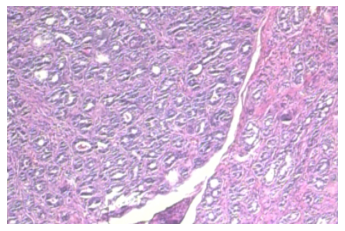

[[0.6708073]] -> Malignantです。


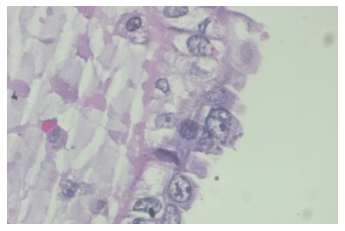

[[0.04418614]] -> Benignです。


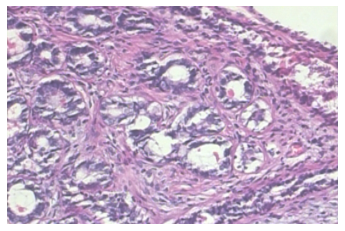

[[0.7958412]] -> Malignantです。


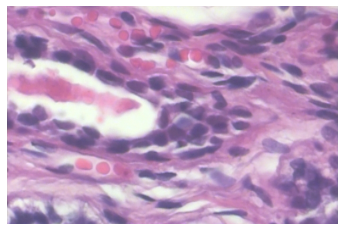

[[0.00494546]] -> Benignです。


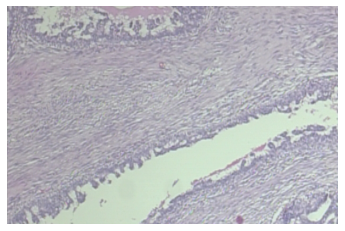

[[0.02136298]] -> Benignです。


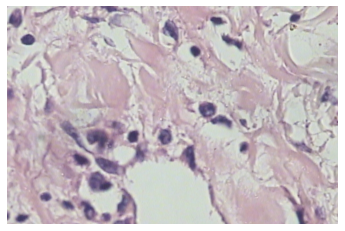

[[0.99438655]] -> Malignantです。


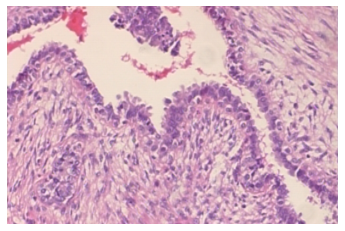

[[5.5636207e-07]] -> Benignです。


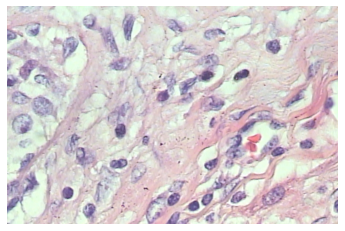

[[0.16666663]] -> Benignです。


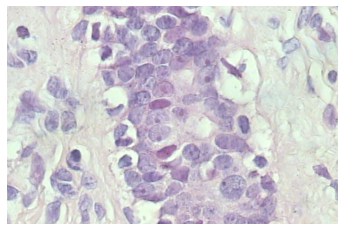

[[0.01211811]] -> Benignです。


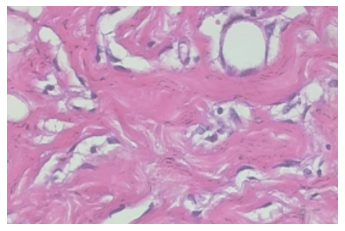

[[8.354207e-05]] -> Benignです。


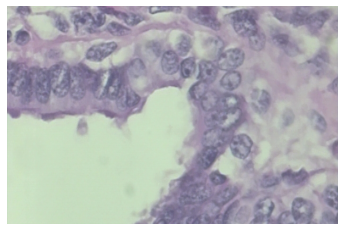

[[0.579764]] -> Malignantです。


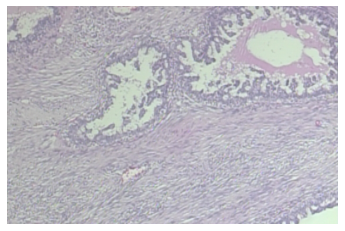

[[3.2165171e-06]] -> Benignです。


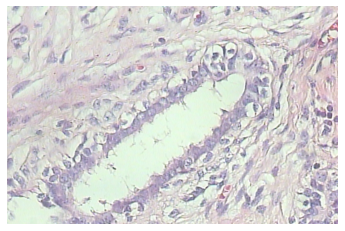

[[0.1472452]] -> Benignです。


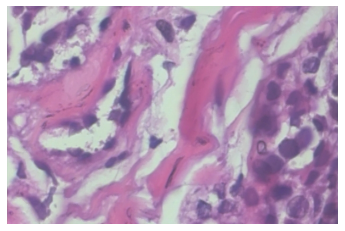

[[0.7477802]] -> Malignantです。


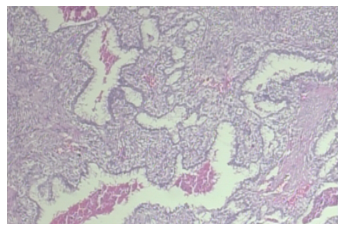

[[3.0006042e-06]] -> Benignです。


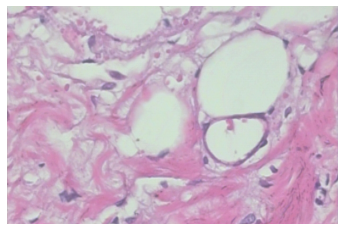

[[0.06320834]] -> Benignです。


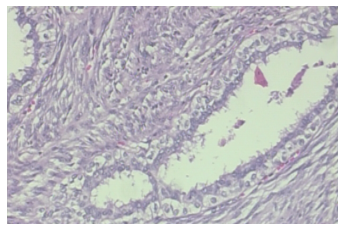

[[5.816299e-11]] -> Benignです。


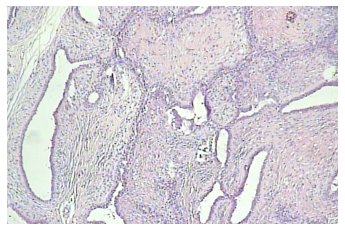

In [7]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

train_data_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/data/train' # 訓練データのフォルダー
validation_data_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/data/validation' # テストデータのフォルダー
result_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/results'        # VGG19の出力結果を保存するフォルダー
test_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/test'
    

normal_files=os.listdir(os.path.join(test_dir,'benign'))
print(len(normal_files))
print(normal_files)

%matplotlib inline


for i in range(len(normal_files)):
  predictBreakHisVGG19(os.path.join(test_dir,'benign',normal_files[i]))




### 乳癌患者由来の画像に対して、先ほど構築したモデルで予測する。
『malignantです。』と表示されていれば、正解。

In [9]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

train_data_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/data/train' # 訓練データのフォルダー
validation_data_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/data/validation' # テストデータのフォルダー
result_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/results'        # VGG19の出力結果を保存するフォルダー
test_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/test'
  

malignant_files=os.listdir(os.path.join(test_dir,'malignant'))
print(len(malignant_files))
print(malignant_files)



75
['SOB_M_LC-14-13412-400-024.png', 'SOB_M_DC-14-2980-400-009.png', 'SOB_M_DC-14-2523-100-033.png', 'SOB_M_LC-14-13412-200-011.png', 'SOB_M_DC-14-18650-400-025.png', 'SOB_M_DC-14-6241-200-012.png', 'SOB_M_DC-14-17614-100-004.png', 'SOB_M_DC-14-18650-400-012.png', 'SOB_M_LC-14-15570-200-039.png', 'SOB_M_DC-14-3909-400-002.png', 'SOB_M_DC-14-11951-40-020.png', 'SOB_M_DC-14-2980-200-016.png', 'SOB_M_DC-14-18650-400-016.png', 'SOB_M_DC-14-3909-200-007.png', 'SOB_M_MC-14-13413-400-005.png', 'SOB_M_LC-14-15570-100-025.png', 'SOB_M_DC-14-17915-100-009.png', 'SOB_M_PC-14-15704-100-014.png', 'SOB_M_DC-14-17614-40-038.png', 'SOB_M_PC-14-15687B-400-014.png', 'SOB_M_DC-14-16716-40-021.png', 'SOB_M_PC-14-15704-400-015.png', 'SOB_M_DC-14-17915-40-016.png', 'SOB_M_DC-14-11520-100-021.png', 'SOB_M_DC-14-17915-400-013.png', 'SOB_M_MC-14-13413-400-015.png', 'SOB_M_DC-14-17915-200-019.png', 'SOB_M_DC-14-16716-100-024.png', 'SOB_M_DC-14-11520-200-007.png', 'SOB_M_LC-14-15570-40-027.png', 'SOB_M_PC-14-157

[[0.99852437]] -> Malignantです。


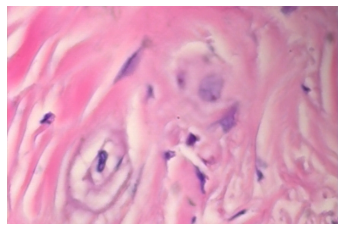

[[0.9991505]] -> Malignantです。


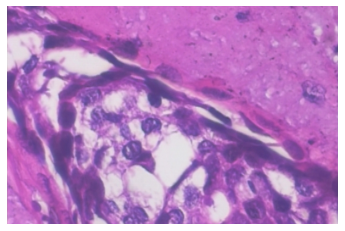

[[0.99999416]] -> Malignantです。


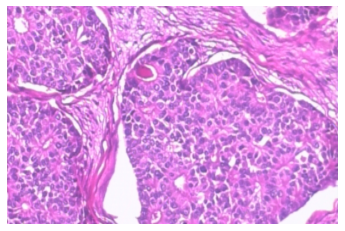

[[0.9982356]] -> Malignantです。


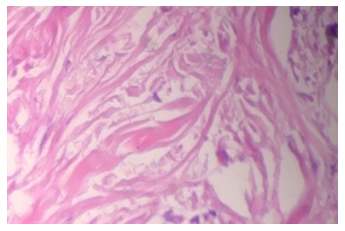

[[0.99948716]] -> Malignantです。


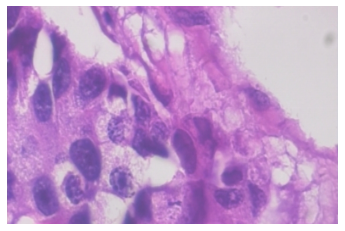

[[0.99593675]] -> Malignantです。


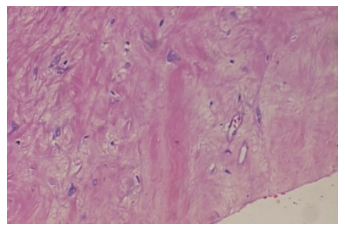

[[0.9998092]] -> Malignantです。


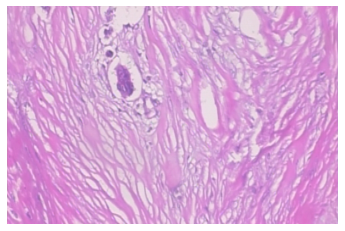

[[0.9999603]] -> Malignantです。


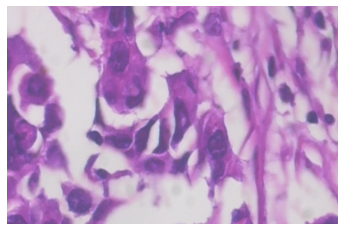

[[0.9999249]] -> Malignantです。


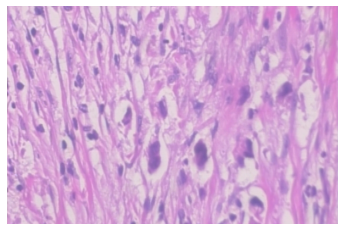

[[0.9921474]] -> Malignantです。


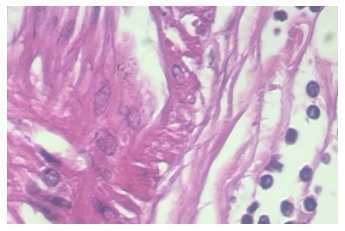

[[0.99995124]] -> Malignantです。


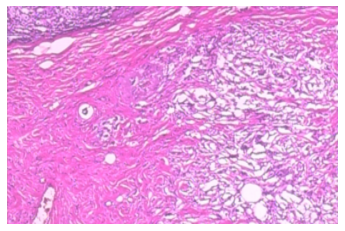

[[0.99991786]] -> Malignantです。


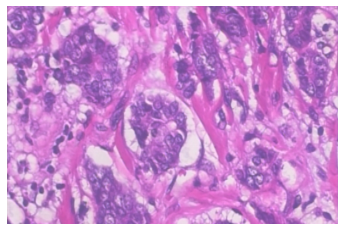

[[0.9995408]] -> Malignantです。


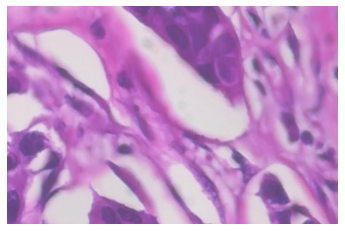

[[0.9921991]] -> Malignantです。


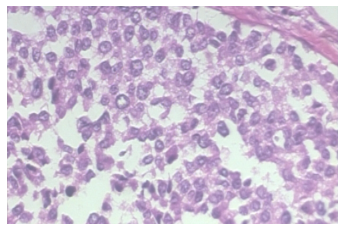

[[0.98072547]] -> Malignantです。


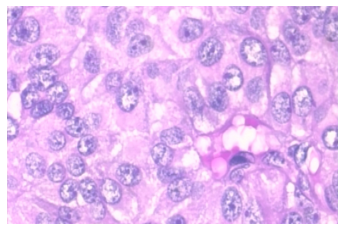

[[0.97474664]] -> Malignantです。


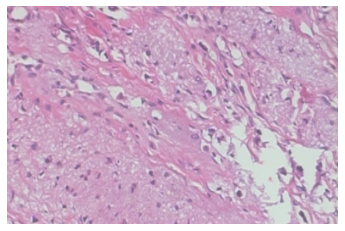

[[0.99996436]] -> Malignantです。


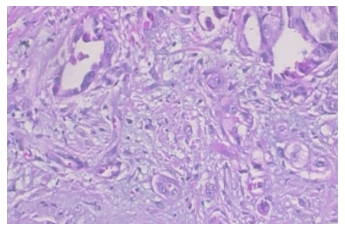

[[0.9999914]] -> Malignantです。


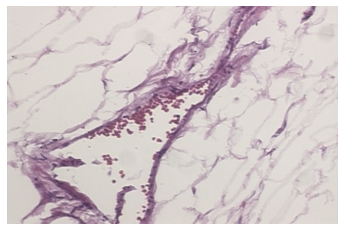

[[0.9999988]] -> Malignantです。


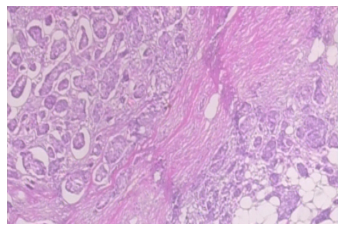

[[0.0096439]] -> Benignです。


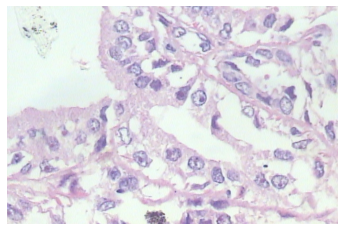

[[1.]] -> Malignantです。


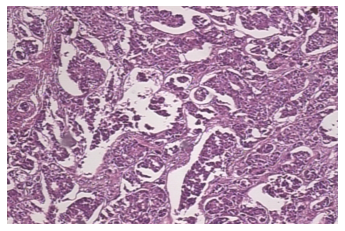

[[0.86786383]] -> Malignantです。


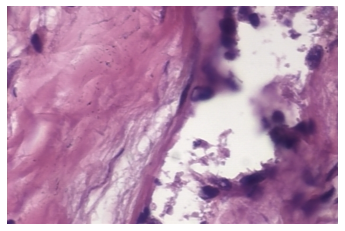

[[0.99932575]] -> Malignantです。


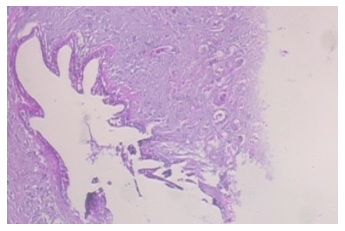

[[0.9996202]] -> Malignantです。


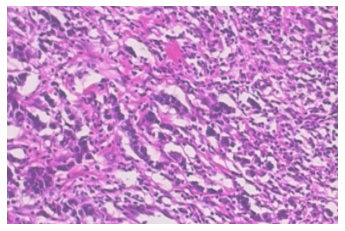

[[0.99999714]] -> Malignantです。


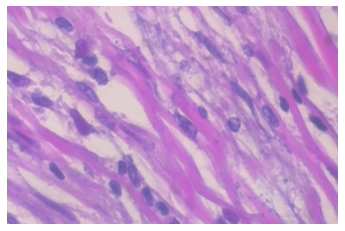

[[0.9926819]] -> Malignantです。


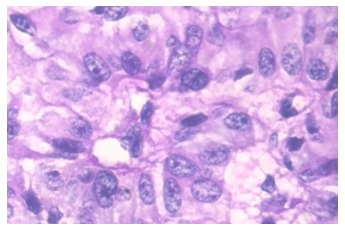

[[0.9987545]] -> Malignantです。


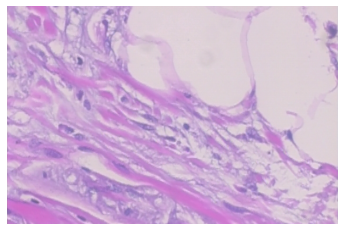

[[1.]] -> Malignantです。


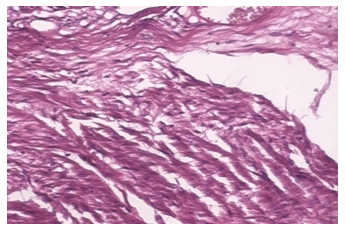

[[0.9983748]] -> Malignantです。


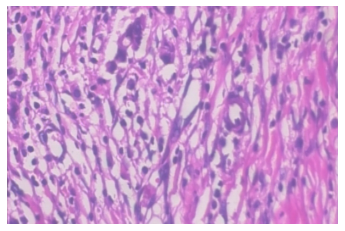

ResourceExhaustedError: ignored

In [10]:


for i in range(len(malignant_files)):
  predictBreakHisVGG19(os.path.join(test_dir,'malignant', malignant_files[i]))
    


##【考察】  
乳癌患者由来の画像については、２９枚中、２８枚が正解であった。
健康成人由来の画像については、６０枚中、４３枚が正解であった。


特に、乳癌患者由来の画像を乳癌として正しく判定できる確率は、９６．５５％であった。

##第６章 特徴データの抽出（次回へ）


## 第７章　特徴データのt-SNEで可視化（次回へ）